# TPF Super-Resolución — Resultados

Notebook **definitivo** del trabajo, organizado por fases. Reproduce toda la evidencia
(tablas, figuras, comparación calidad-vs-costo y una demo) a partir de los pesos en `outputs/`.
**No entrena nada**: solo lee modelos ya entrenados y dibuja.

Corré las celdas de arriba a abajo. Abrilo con el kernel del entorno del proyecto
(con `torch`, `opencv`, `scikit-image`, `matplotlib`).

**Fases:**
1. Setup + gate de la métrica
2. Generar tablas y figuras
3. Resultados: tablas PSNR/SSIM
4. Figuras: paneles cualitativos + curvas de convergencia
5. Calidad vs costo: modelo chico vs EDSR
6. Demo interactiva

## Fase 1 — Setup + gate de la métrica

Antes de mostrar resultados, validamos que nuestra forma de medir PSNR es correcta:
`metrics_check.py` calcula el PSNR del bicubic en Set5 y lo compara con los valores
canónicos de los papers. Si pasa, los números de todos los modelos son confiables.

In [1]:
# Parámetros del análisis y posicionamiento en src/
SCALES = '2 3 4'                              # factores a evaluar
TESTSETS = 'Set5 Set14 BSD100 Urban100'      # conjuntos de prueba
import os
os.chdir(os.path.join(os.path.dirname(os.path.abspath('')), 'src'))
print('cwd:', os.getcwd())

# Gate: el PSNR del bicubic debe coincidir con los valores publicados.
!python metrics_check.py

cwd: /Users/frino/Desktop/Udesa/3 AÑO/Vision/Final-final/src
dataset   sf    PSNR   canon   dPSNR    SSIM
Set5       2   33.68   33.66   +0.02  0.9370  OK
Set5       3   30.41   30.39   +0.02  0.8806  OK
Set5       4   28.43   28.42   +0.01  0.8232  OK
Set14      2   30.33   30.24   +0.09  0.8815  OK
Set14      3   27.63   27.55   +0.08  0.7938  OK
Set14      4   26.09   26.00   +0.09  0.7217  OK


## Fase 2 — Generar tablas y figuras

`make_figures.py` descubre todos los modelos en `outputs/` y produce las tablas
(`tables.md`), los paneles cualitativos y las curvas de convergencia. `bench.py` mide
la eficiencia (params, latencia, FPS). Con muchos modelos esto tarda unos minutos.

In [2]:
# Se corren como subproceso para no mezclar el backend de matplotlib del notebook.
!python make_figures.py --scales {SCALES} --testsets {TESTSETS} --panels 0 2
!python bench.py --scales {SCALES}

device=mps
/Users/frino/.venvs/general/lib/python3.11/site-packages/numpy/_core/fromnumeric.py:3824: RuntimeWarning: Mean of empty slice
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/frino/.venvs/general/lib/python3.11/site-packages/numpy/_core/_methods.py:142: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
# Resultados — PSNR / SSIM (canal Y, con shave)


## Factor x2

| Método | Set5 PSNR | Set5 SSIM | Set14 PSNR | Set14 SSIM | BSD100 PSNR | BSD100 SSIM | Urban100 PSNR | Urban100 SSIM |
|---|---|---|---|---|---|---|---|---|
| nearest | 30.86 | 0.9105 | 28.58 | 0.8606 | 28.42 | 0.8403 | 25.30 | 0.8321 |
| bilinear | 32.25 | 0.9194 | 29.25 | 0.8534 | 28.68 | 0.8252 | 25.68 | 0.8181 |
| bicubic | 33.68 | 0.9370 | 30.33 | 0.8815 | 29.56 | 0.8570 | 26.66 | 0.8541 |
| **edsr_x2_div2k** | **37.00** | **0.9611** | **32.48** | **0.9167** | **31.44** | **0.9005** | **29.18** | **0.9104** |
| **edsr_x2_l1** | **36.57** | **0.9595** | 

## Fase 3 — Resultados: tablas PSNR/SSIM

`tables.md` = calidad de cada modelo vs baselines (nearest/bilinear/bicubic), por escala y
testset. `bench.md` = eficiencia. Las filas `+SE` son con self-ensemble (8 orientaciones).

In [3]:
from IPython.display import Markdown, display
for f in ['../outputs/tables.md', '../outputs/bench.md']:
    if os.path.exists(f):
        display(Markdown(open(f).read()))

# Resultados — PSNR / SSIM (canal Y, con shave)


## Factor x2

| Método | Set5 PSNR | Set5 SSIM | Set14 PSNR | Set14 SSIM | BSD100 PSNR | BSD100 SSIM | Urban100 PSNR | Urban100 SSIM |
|---|---|---|---|---|---|---|---|---|
| nearest | 30.86 | 0.9105 | 28.58 | 0.8606 | 28.42 | 0.8403 | 25.30 | 0.8321 |
| bilinear | 32.25 | 0.9194 | 29.25 | 0.8534 | 28.68 | 0.8252 | 25.68 | 0.8181 |
| bicubic | 33.68 | 0.9370 | 30.33 | 0.8815 | 29.56 | 0.8570 | 26.66 | 0.8541 |
| **edsr_x2_div2k** | **37.00** | **0.9611** | **32.48** | **0.9167** | **31.44** | **0.9005** | **29.18** | **0.9104** |
| **edsr_x2_l1** | **36.57** | **0.9595** | **32.38** | **0.9150** | **31.24** | **0.8973** | **28.90** | **0.9058** |
| **fsrcnn_res_x2_l1** | **36.74** | **0.9605** | **32.48** | **0.9161** | **31.32** | **0.8985** | **29.09** | **0.9094** |
| **fsrcnn_res_x2_l1 +SE** | **37.05** | **0.9620** | **32.69** | **0.9183** | **31.47** | **0.9008** | **29.34** | **0.9128** |
| **fsrcnn_x2_charbonnier** | **36.21** | **0.9571** | **32.13** | **0.9121** | **31.00** | **0.8941** | **28.38** | **0.8964** |
| **fsrcnn_x2_l1** | **36.11** | **0.9569** | **32.15** | **0.9122** | **31.00** | **0.8938** | **28.38** | **0.8968** |
| **fsrcnn_x2_l2** | **36.41** | **0.9578** | **32.26** | **0.9134** | **31.13** | **0.8959** | **28.59** | **0.8998** |
| **srcnn_x2_l1** | **36.37** | **0.9588** | **32.26** | **0.9136** | **31.14** | **0.8958** | **28.73** | **0.9028** |

## Factor x3

| Método | Set5 PSNR | Set5 SSIM | Set14 PSNR | Set14 SSIM | BSD100 PSNR | BSD100 SSIM | Urban100 PSNR | Urban100 SSIM |
|---|---|---|---|---|---|---|---|---|
| nearest | 27.93 | 0.8336 | 26.09 | 0.7592 | 26.18 | 0.7316 | nan | nan |
| bilinear | 29.54 | 0.8631 | 27.04 | 0.7723 | 26.79 | 0.7375 | nan | nan |
| bicubic | 30.41 | 0.8806 | 27.63 | 0.7938 | 27.21 | 0.7589 | nan | nan |
| **edsr_x3_div2k** | **33.01** | **0.9226** | **29.29** | **0.8391** | **28.42** | **0.8074** | **nan** | **nan** |
| **edsr_x3_l1** | **32.87** | **0.9210** | **29.29** | **0.8381** | **28.37** | **0.8046** | **nan** | **nan** |
| **fsrcnn_res_x3_l1** | **32.94** | **0.9224** | **29.40** | **0.8397** | **28.41** | **0.8061** | **nan** | **nan** |
| **fsrcnn_res_x3_l1 +SE** | **33.13** | **0.9248** | **29.54** | **0.8426** | **28.51** | **0.8084** | **nan** | **nan** |
| **fsrcnn_x3_l1** | **32.19** | **0.9124** | **28.97** | **0.8311** | **28.11** | **0.7978** | **nan** | **nan** |

## Factor x4

| Método | Set5 PSNR | Set5 SSIM | Set14 PSNR | Set14 SSIM | BSD100 PSNR | BSD100 SSIM | Urban100 PSNR | Urban100 SSIM |
|---|---|---|---|---|---|---|---|---|
| nearest | 26.26 | 0.7640 | 24.74 | 0.6814 | 25.04 | 0.6539 | 22.17 | 0.6406 |
| bilinear | 27.56 | 0.7992 | 25.51 | 0.6959 | 25.54 | 0.6611 | 22.69 | 0.6478 |
| bicubic | 28.43 | 0.8232 | 26.09 | 0.7217 | 25.96 | 0.6857 | 23.14 | 0.6736 |
| **edsr_x4_div2k** | **30.71** | **0.8810** | **27.67** | **0.7756** | **26.95** | **0.7355** | **24.55** | **0.7457** |
| **edsr_x4_gan** | **29.06** | **0.8283** | **26.57** | **0.7303** | **26.13** | **0.6950** | **23.82** | **0.7017** |
| **edsr_x4_l1** | **30.32** | **0.8772** | **27.39** | **0.7714** | **26.79** | **0.7315** | **24.39** | **0.7389** |
| **edsr_x4_perceptual** | **27.85** | **0.7878** | **25.79** | **0.7041** | **25.63** | **0.6745** | **23.15** | **0.6675** |
| **fsrcnn_res_x4_l1** | **30.66** | **0.8811** | **27.69** | **0.7753** | **26.96** | **0.7339** | **24.56** | **0.7439** |
| **fsrcnn_res_x4_l1 +SE** | **30.90** | **0.8850** | **27.81** | **0.7788** | **27.05** | **0.7367** | **24.66** | **0.7477** |
| **fsrcnn_x4_l1** | **30.09** | **0.8668** | **27.28** | **0.7651** | **26.74** | **0.7265** | **24.14** | **0.7257** |
| **srcnn_x4_l1** | **30.27** | **0.8702** | **27.42** | **0.7647** | **26.80** | **0.7242** | **24.27** | **0.7277** |


# Eficiencia — parámetros, latencia, FPS


## Factor x2 (device=mps)

| Modelo | Params | ms/img | FPS | Set5 PSNR |
|---|---|---|---|---|
| edsr_x2_div2k | 776,705 | 16.52 | 60.5 | 37.00 |
| edsr_x2_l1 | 776,705 | 17.14 | 58.3 | 36.57 |
| fsrcnn_res_x2_l1 | 12,809 | 1.77 | 563.4 | 36.74 |
| fsrcnn_x2_charbonnier | 12,809 | 1.00 | 1002.4 | 36.21 |
| fsrcnn_x2_l1 | 12,809 | 1.00 | 1001.5 | 36.11 |
| fsrcnn_x2_l2 | 12,809 | 1.45 | 690.5 | 36.41 |
| srcnn_x2_l1 | 57,281 | 0.90 | 1113.4 | 36.37 |

## Factor x3 (device=mps)

| Modelo | Params | ms/img | FPS | Set5 PSNR |
|---|---|---|---|---|
| edsr_x3_div2k | 961,345 | 10.90 | 91.7 | 33.01 |
| edsr_x3_l1 | 961,345 | 10.40 | 96.2 | 32.87 |
| fsrcnn_res_x3_l1 | 12,809 | 1.84 | 543.5 | 32.94 |
| fsrcnn_x3_l1 | 12,809 | 0.64 | 1561.3 | 32.19 |

## Factor x4 (device=mps)

| Modelo | Params | ms/img | FPS | Set5 PSNR |
|---|---|---|---|---|
| edsr_x4_div2k | 924,417 | 8.06 | 124.1 | 30.71 |
| edsr_x4_gan | 924,417 | 7.75 | 129.1 | 29.06 |
| edsr_x4_l1 | 924,417 | 7.70 | 129.9 | 30.32 |
| edsr_x4_perceptual | 924,417 | 7.68 | 130.2 | 27.85 |
| fsrcnn_res_x4_l1 | 12,809 | 1.97 | 507.5 | 30.66 |
| fsrcnn_x4_l1 | 12,809 | 0.37 | 2690.5 | 30.09 |
| srcnn_x4_l1 | 57,281 | 0.13 | 7803.5 | 30.27 |


## Fase 4 — Figuras: paneles cualitativos + curvas

- `panel_*` : comparación visual LR | bicubic | modelo | GT (con PSNR).
- `conv_*`  : curvas de convergencia (PSNR de validación vs época).
- `speed_*` : calidad vs latencia (scatter del benchmark).
- `perception_*` : trade-off distorsión-percepción (bicubic | mejor-PSNR | GAN | GT).

../outputs/figures/conv_x2.png


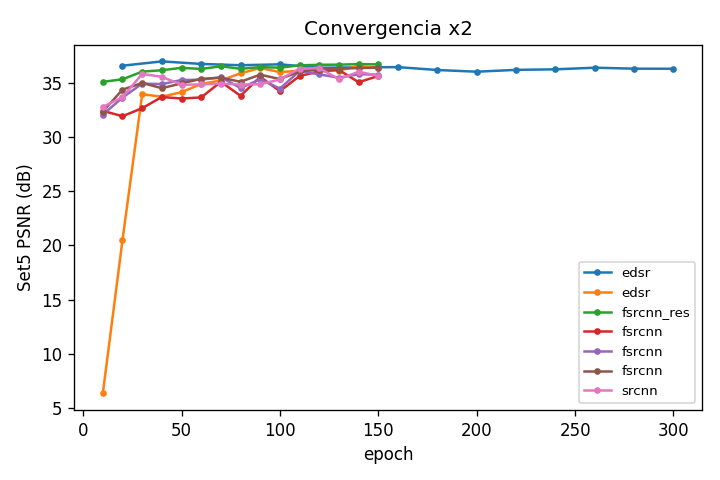

../outputs/figures/conv_x3.png


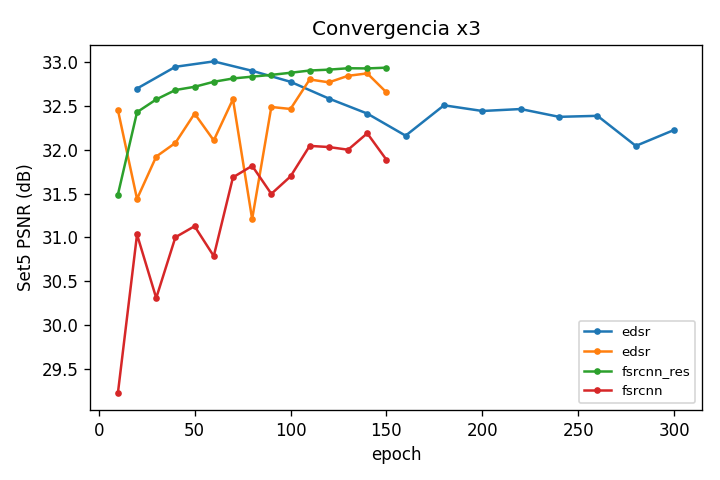

../outputs/figures/conv_x4.png


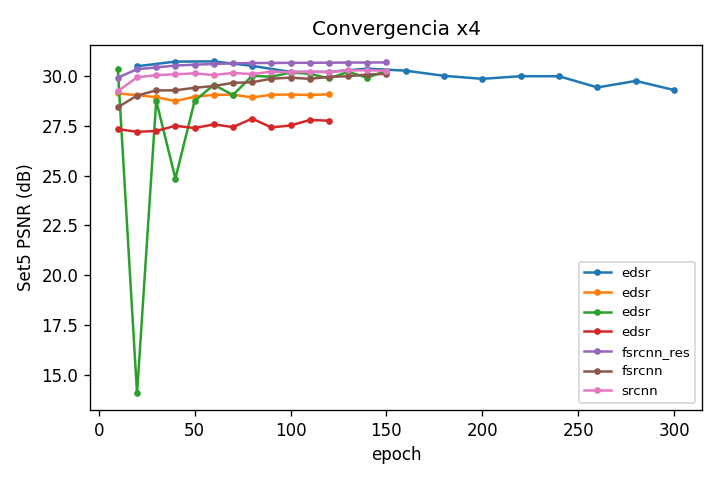

../outputs/figures/panel_Set5_x2_0.png


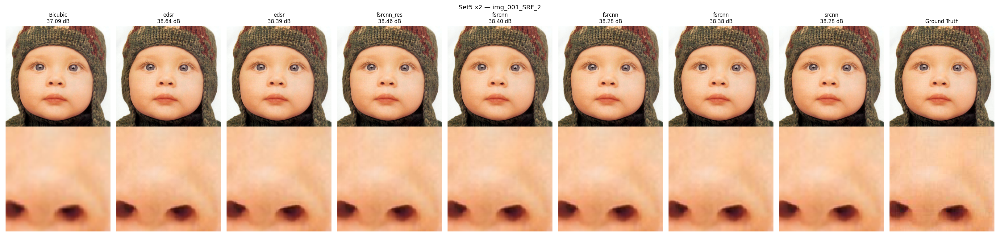

../outputs/figures/panel_Set5_x2_2.png


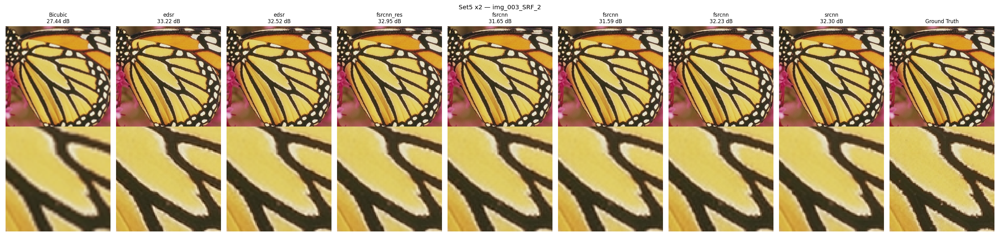

../outputs/figures/panel_Set5_x3_0.png


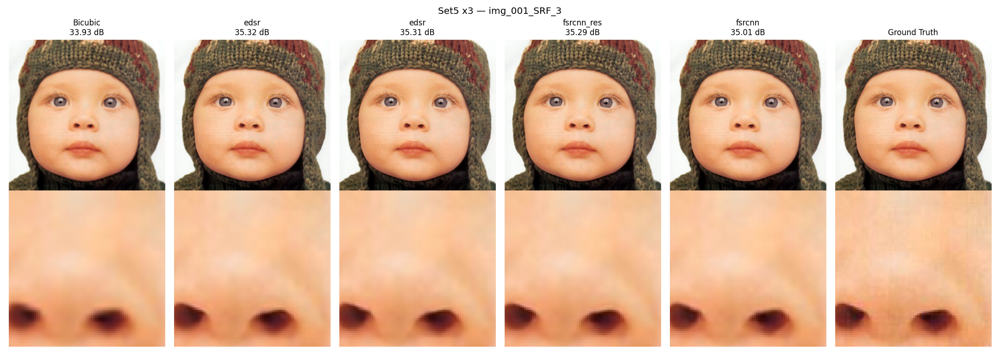

../outputs/figures/panel_Set5_x3_2.png


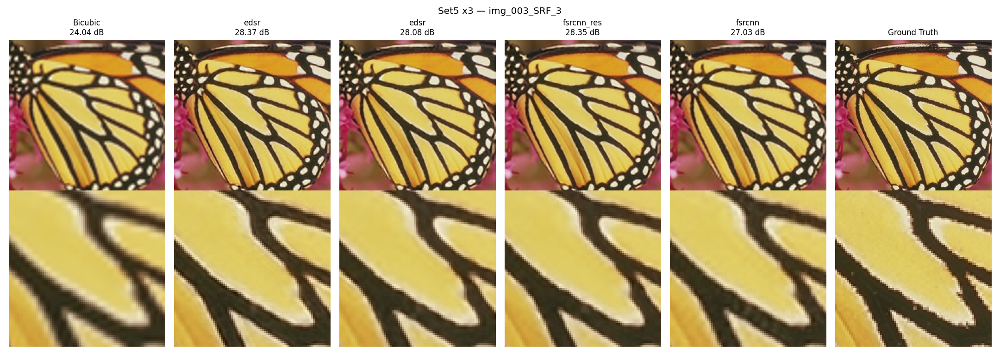

../outputs/figures/panel_Set5_x4_0.png


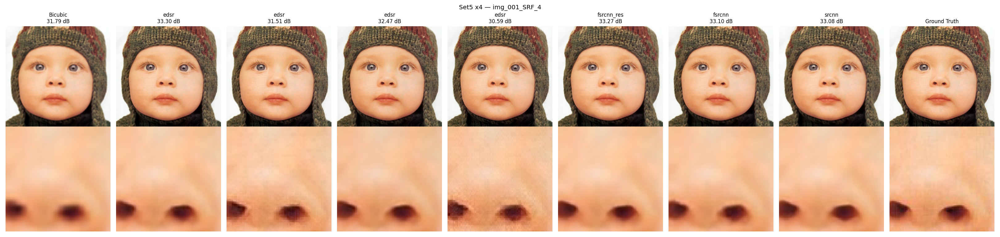

../outputs/figures/panel_Set5_x4_2.png


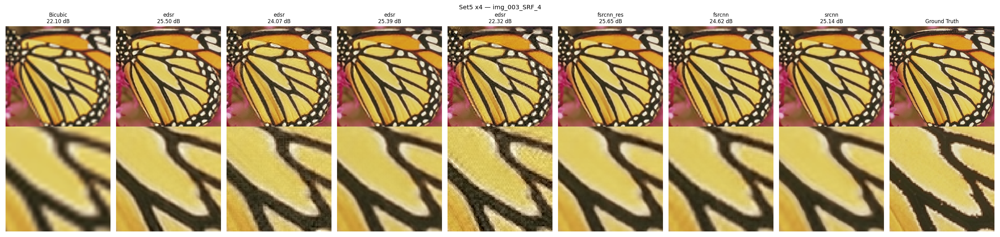

../outputs/figures/perception_x4.png


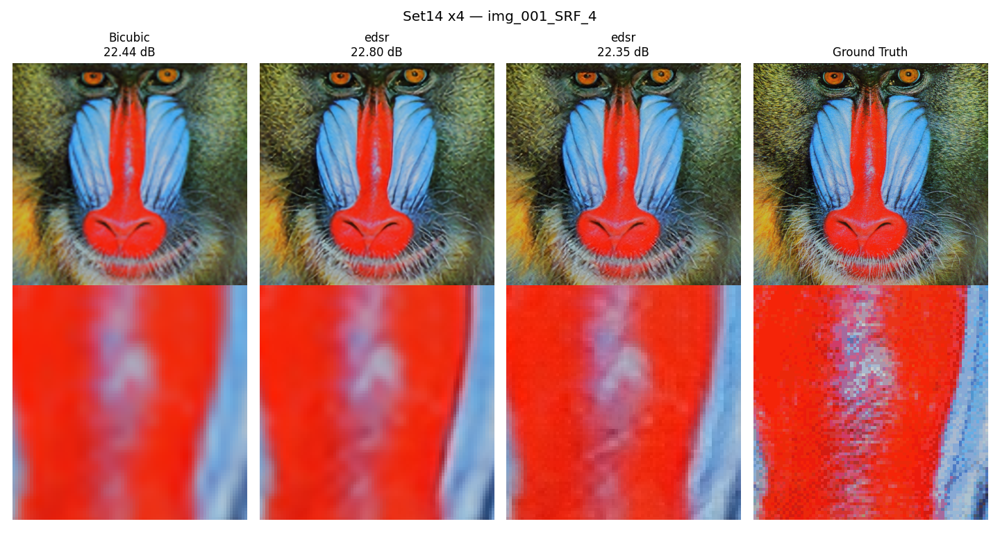

../outputs/figures/speed_x2.png


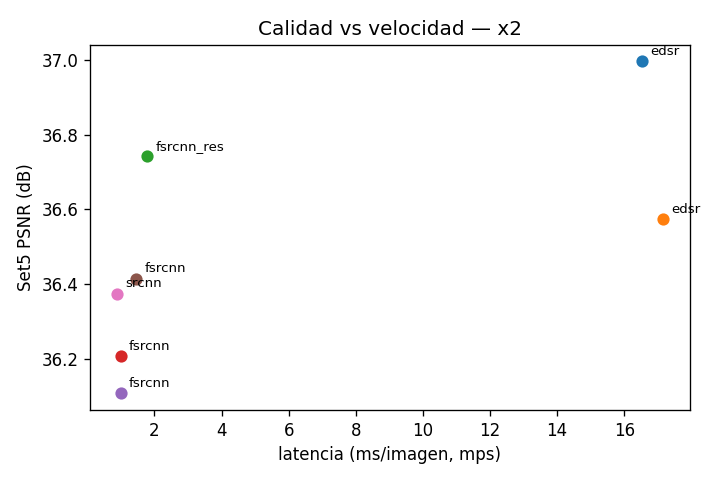

../outputs/figures/speed_x3.png


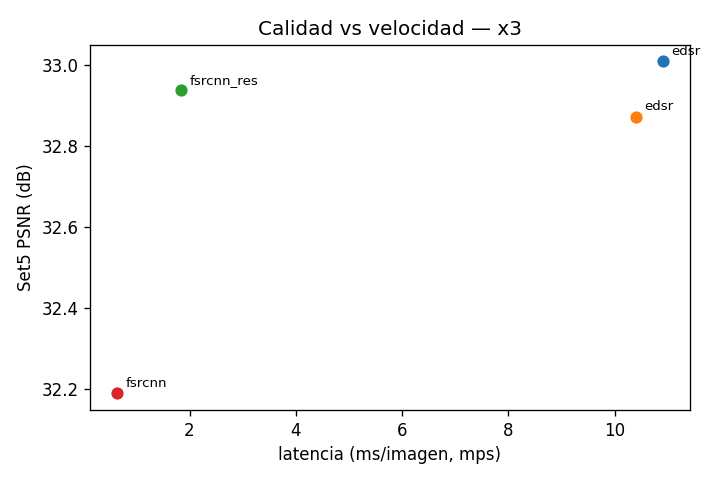

../outputs/figures/speed_x4.png


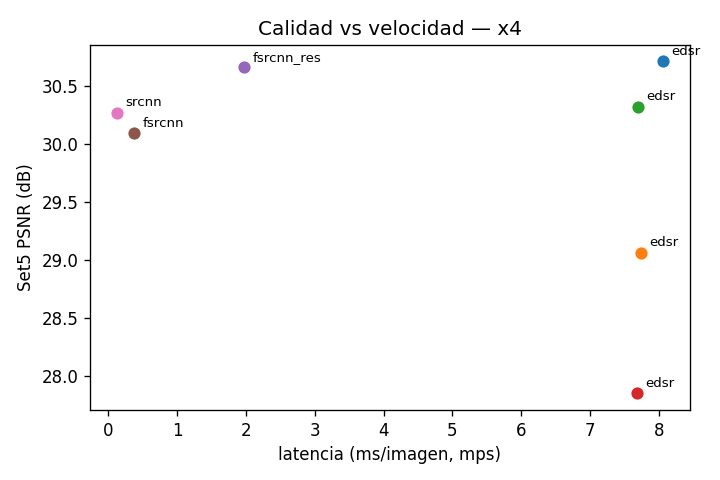

In [4]:
import glob
from IPython.display import Image, display
for p in sorted(glob.glob('../outputs/figures/*.png')):
    print(p)
    display(Image(p))

## Fase 5 — Calidad vs costo: modelo chico vs EDSR

La pregunta central del trabajo: **¿conviene un modelo chico bien usado o uno grande?**
Comparamos, por escala, calidad (PSNR) **y** costo (parámetros + tiempo de inferencia):

- **FSRCNN-residual** (nuestro, ~13k params, T91)
- **FSRCNN-res + self-ensemble** (el mismo, promediando 8 orientaciones)
- **EDSR (mismo dataset T91)** — red grande, ~70x más parámetros
- **EDSR (dataset grande DIV2K)** — la misma red, con muchos más datos

In [5]:
import time, numpy as np, torch
from eval import load_set, rgb2ycbcr, eval_model, sr_y_self_ensemble
from models import build_model
DEV = 'cuda' if torch.cuda.is_available() else ('mps' if torch.backends.mps.is_available() else 'cpu')

def _cargar(arch, s, tag):
    m = build_model(arch, s).to(DEV)
    m.load_state_dict(torch.load(f'../outputs/{tag}/best.pth', map_location=DEV)); m.eval(); return m

@torch.no_grad()
def _latencia_ms(m, items, s, se=False):
    """ms/imagen. se=True usa self-ensemble (8 pasadas -> ~8x más lento)."""
    ys = [torch.from_numpy((rgb2ycbcr(it['lr'])[0] / 255.)[None, None].astype(np.float32)).to(DEV)
          for it in items]
    for _ in range(2):                                  # warmup (no se mide)
        sr_y_self_ensemble(m, items[0]['lr'], s, DEV) if se else m(ys[0])
    tt = []
    for _ in range(5):
        t0 = time.perf_counter()
        for k, it in enumerate(items):
            sr_y_self_ensemble(m, it['lr'], s, DEV) if se else m(ys[k])
        tt.append((time.perf_counter() - t0) / len(items))
    return np.mean(tt) * 1000

L = []
for s in [2, 3, 4]:
    L += [f'### Factor x{s}  (device={DEV})', '',
          '| Modelo | Dataset | Params | PSNR Set5 | SSIM | ms/img | FPS |',
          '|---|---|---|---|---|---|---|']
    for nombre, arch, tag, ds, se in [
        ('FSRCNN-res (nuestro)',       'fsrcnn_res', f'fsrcnn_res_x{s}_l1',  'T91',   False),
        ('FSRCNN-res + self-ensemble', 'fsrcnn_res', f'fsrcnn_res_x{s}_l1',  'T91',   True),
        ('EDSR (mismo dataset)',       'edsr',       f'edsr_x{s}_l1',        'T91',   False),
        ('EDSR (dataset grande)',      'edsr',       f'edsr_x{s}_div2k',     'DIV2K', False)]:
        if not os.path.exists(f'../outputs/{tag}/best.pth'):
            continue
        m = _cargar(arch, s, tag); p = sum(x.numel() for x in m.parameters())
        ps, ss = eval_model(m, 'Set5', s, DEV, self_ensemble=se)
        ms = _latencia_ms(m, load_set('Set5', s), s, se)
        L.append(f'| {nombre} | {ds} | {p:,} | {ps:.2f} | {ss:.4f} | {ms:.2f} | {1000/ms:.0f} |')
    L.append('')
open('../outputs/comparacion_final.md', 'w').write('# Comparación final — calidad vs costo\n\n' + '\n'.join(L))
display(Markdown('\n'.join(L)))

### Factor x2  (device=mps)

| Modelo | Dataset | Params | PSNR Set5 | SSIM | ms/img | FPS |
|---|---|---|---|---|---|---|
| FSRCNN-res (nuestro) | T91 | 12,809 | 36.74 | 0.9605 | 0.97 | 1032 |
| FSRCNN-res + self-ensemble | T91 | 12,809 | 37.05 | 0.9620 | 19.17 | 52 |
| EDSR (mismo dataset) | T91 | 776,705 | 36.57 | 0.9595 | 15.44 | 65 |
| EDSR (dataset grande) | DIV2K | 776,705 | 37.00 | 0.9611 | 14.67 | 68 |

### Factor x3  (device=mps)

| Modelo | Dataset | Params | PSNR Set5 | SSIM | ms/img | FPS |
|---|---|---|---|---|---|---|
| FSRCNN-res (nuestro) | T91 | 12,809 | 32.94 | 0.9224 | 0.35 | 2867 |
| FSRCNN-res + self-ensemble | T91 | 12,809 | 33.13 | 0.9248 | 15.79 | 63 |
| EDSR (mismo dataset) | T91 | 961,345 | 32.87 | 0.9210 | 8.55 | 117 |
| EDSR (dataset grande) | DIV2K | 961,345 | 33.01 | 0.9226 | 8.57 | 117 |

### Factor x4  (device=mps)

| Modelo | Dataset | Params | PSNR Set5 | SSIM | ms/img | FPS |
|---|---|---|---|---|---|---|
| FSRCNN-res (nuestro) | T91 | 12,809 | 30.66 | 0.8811 | 0.35 | 2887 |
| FSRCNN-res + self-ensemble | T91 | 12,809 | 30.90 | 0.8850 | 10.80 | 93 |
| EDSR (mismo dataset) | T91 | 924,417 | 30.32 | 0.8772 | 6.89 | 145 |
| EDSR (dataset grande) | DIV2K | 924,417 | 30.71 | 0.8810 | 6.90 | 145 |


**Lectura:** EDSR con T91 (mismo dataset) queda por debajo del FSRCNN-res; con DIV2K sube y
supera al FSRCNN-res *básico*, pero el FSRCNN-res + self-ensemble lo iguala/supera con ~70x menos
parámetros. Trade-off: el FSRCNN-res pelado es el más rápido (mejor para velocidad); con
self-ensemble gana calidad a costa de ~8x el tiempo. **Un modelo chico bien explotado compite con
uno grande a una fracción del tamaño.**

## Fase 6 — Demo interactiva

Super-resoluciona UNA imagen con el modelo que elijas y compara: bicubic | modelo | GT,
con el PSNR de cada uno. Cambiá la línea `--- elegí acá ---` para probar otros modelos.

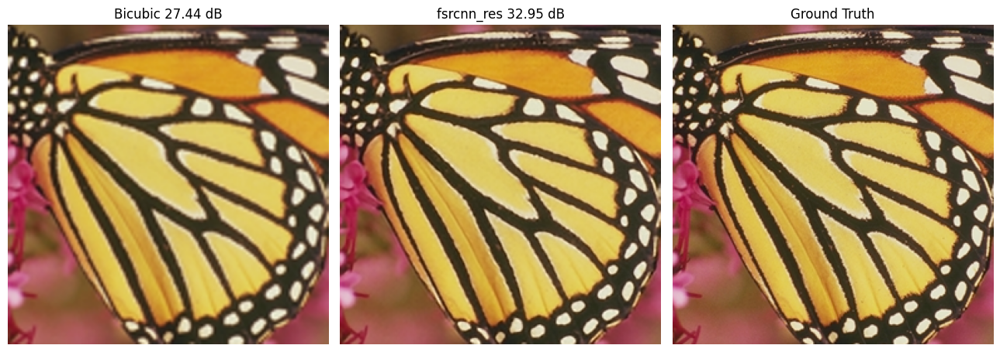

In [6]:
%matplotlib inline
import matplotlib.pyplot as plt
from eval import sr_from_model, rgb2y, _psnr_arr
from baselines import upsample_to

# --- elegí acá ---------------------------------------------------------------
#   TAG = carpeta en outputs/ (ej 'fsrcnn_res_x2_l1', 'edsr_x4_div2k', 'edsr_x4_gan')
#   ARCH = 'srcnn' | 'fsrcnn' | 'fsrcnn_res' | 'edsr' ;  SCALE = 2/3/4
#   DATASET = 'Set5'|'Set14'|'BSD100'|'Urban100' ;  IDX = nº de imagen
TAG, ARCH, SCALE, DATASET, IDX = 'fsrcnn_res_x2_l1', 'fsrcnn_res', 2, 'Set5', 2
# -----------------------------------------------------------------------------

m = build_model(ARCH, SCALE).to(DEV)
m.load_state_dict(torch.load(f'../outputs/{TAG}/best.pth', map_location=DEV)); m.eval()
it = load_set(DATASET, SCALE)[IDX]
bic = upsample_to(it['lr'], it['hr'].shape[:2], 'bicubic')
sr, y_sr = sr_from_model(m, it['lr'], SCALE, DEV)
y_hr = rgb2y(it['hr'])[:y_sr.shape[0], :y_sr.shape[1]]
p_bic = _psnr_arr(rgb2y(bic), rgb2y(it['hr'])[:bic.shape[0], :bic.shape[1]], SCALE)
p_sr = _psnr_arr(y_sr, y_hr, SCALE)

fig, ax = plt.subplots(1, 3, figsize=(13, 5))
for a, img, t in zip(ax, [bic, sr, it['hr']],
                     [f'Bicubic {p_bic:.2f} dB', f'{ARCH} {p_sr:.2f} dB', 'Ground Truth']):
    a.imshow(img); a.set_title(t); a.axis('off')
plt.tight_layout(); plt.show()